#### Build Flask app

In [66]:
%%writefile DetectronFlask.py

from flask import Flask, request, send_file
from healthcheck import HealthCheck
from PIL import Image
import os, cv2, joblib, logging, torch
import numpy as np

import detectron2
from detectron2.utils.visualizer import Visualizer


logging.basicConfig(format='%(message)s', level=logging.INFO)
app = Flask(__name__)

logging.info(f"=== LOGGING: torch = {torch.__version__}; cuda is avaliable:{torch.cuda.is_available()}")

MODEL_JOBLIB_FILE = './model/model.joblib'
predictor = joblib.load(MODEL_JOBLIB_FILE)
logging.info('=== LOGGING: All models loaded succcessfully')


def howami():
    return True, "I am alive. Thanks for checking.."

def detectron_check():
    return True, f'Detectron2 is available. Version == {str(detectron2.__version__)}' 

health = HealthCheck(app, "/hcheck")
health.add_check(howami)
health.add_check(detectron_check)


@app.route('/')
def hello():
    return 'Welcome to Books Prediction Application (Detectron2)'


def scorer(file_name):
    im = cv2.imread(file_name)
    outputs = predictor(im)   
    return outputs


@app.route('/predict', methods=['POST'])
def predict():
    output_data = request.form.get('output_data')
    
    if output_data not in ['predicted_masks', 'photo']:
        return 'Invalid "output_data" parameter. Valid values: "predicted_masks", "photo"', 400   
    logging.info(f'Received incoming message - output_data: {output_data}')
    
    if 'photo' not in request.files:
        return 'File for predict is not founded', 400
    file = request.files['photo'] 
    logging.info(f'Received incoming file - {file.filename}')    
        
    INPUT_PHOTO_FILE = './temp/input_photo.png'
    OUTPUT_PHOTO_FILE = './temp/output_photo.png'
    OUTPUT_COMPRESSED_FILE = './temp/output.pred_masks'
    
    img = Image.open(file)
    img.save(INPUT_PHOTO_FILE, format='PNG')
    
    
    #predict books segments
    predictions = scorer(INPUT_PHOTO_FILE)
    
   
    if output_data == 'predicted_masks':
        pred_masks = predictions['instances'].pred_masks.numpy()
        joblib.dump(pred_masks, OUTPUT_COMPRESSED_FILE,compress=True)        
        return send_file(OUTPUT_COMPRESSED_FILE)

    else:
        im = cv2.imread(INPUT_PHOTO_FILE)
        v = Visualizer(im[:, :, ::-1], scale=1.)
        out = v.draw_instance_predictions(predictions['instances']).get_image()[:, :, ::-1]
        im = Image.fromarray(out)
        im.save(OUTPUT_PHOTO_FILE, format='PNG')
        return send_file(OUTPUT_PHOTO_FILE)



if __name__ == "__main__":
    app.run(host='0.0.0.0', port=int(os.environ.get('PORT', 5000)))


Overwriting DetectronFlask.py


#### Check service is ready

In [59]:
!curl http://localhost:5000

Welcome to Books Prediction Application (Detectron2)

In [60]:
!curl http://localhost:5000/hcheck

{"hostname": "pytorch-1-9-20210729-095901", "status": "success", "timestamp": 1628574609.550172, "results": [{"checker": "howami", "output": "I am alive. Thanks for checking..", "passed": true, "timestamp": 1628574609.5501435, "expires": 1628574636.5501435}, {"checker": "detectron_check", "output": "Detectron2 is available. Version == 0.5", "passed": true, "timestamp": 1628574609.5501492, "expires": 1628574636.5501492}]}

#### Example 1. Get photo wit predicted segments

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs
200 OK


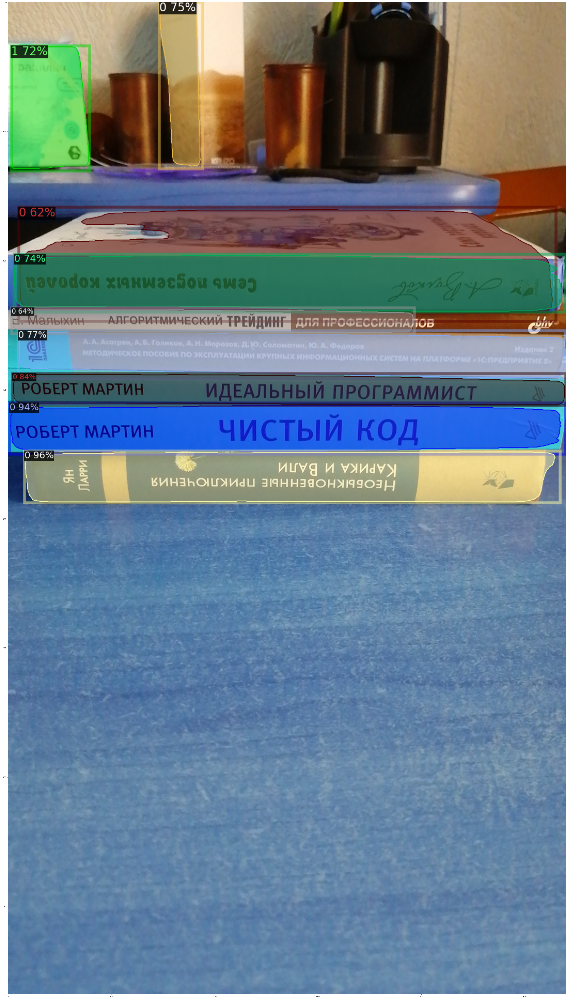

In [67]:
%time
import requests, shutil
from PIL import Image
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (50,100)

URL = 'http://localhost:5000/predict'
TEST_PHOTO = 'test_photo.jpg'
PREDICTED_PHOTO = './temp/downloaded_photo.png'

rs = requests.post(URL, data={'output_data': 'photo'}, files={'photo': open(TEST_PHOTO, 'rb')}, stream=True)
print(rs.status_code, rs.reason)

with open(PREDICTED_PHOTO,"wb") as receive:
    shutil.copyfileobj(rs.raw,receive)
del rs

im = Image.open(PREDICTED_PHOTO)
plt.imshow(im);

#### Example 2. Get predicted masks (numpy array)

In [68]:
%time
import requests, shutil, joblib
import numpy as np

URL = 'http://localhost:5000/predict'
TEST_PHOTO = 'test_photo.jpg'
PREDICTIONS_COMPRESSED_FILE = './temp/preds.download'

rs = requests.post(URL, data={'output_data': 'predicted_masks'}, files={'photo': open(TEST_PHOTO, 'rb')}, stream=True)
print(rs.status_code, rs.reason)

with open(PREDICTIONS_COMPRESSED_FILE,"wb") as receive:
    shutil.copyfileobj(rs.raw,receive)
del rs

pred_masks = joblib.load(PREDICTIONS_COMPRESSED_FILE)
print(type(pred_masks), pred_masks.shape)
pred_masks

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs
200 OK
<class 'numpy.ndarray'> (9, 1920, 1080)


array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal